# Analyzing 22-year Housing Prices in the United Kingdom 

### How to run the code

This tutorial is an executable [Jupyter notebook](https://jupyter.org) hosted on [Jovian](https://www.jovian.ai). You can _run_ this tutorial and experiment with the code examples in a couple of ways: *using free online resources* (recommended) or *on your computer*.

#### Option 1: Running using free online resources (1-click, recommended)

The easiest way to start executing the code is to click the **Run** button at the top of this page and select **Run on Binder**. You can also select "Run on Colab" or "Run on Kaggle", but you'll need to create an account on [Google Colab](https://colab.research.google.com) or [Kaggle](https://kaggle.com) to use these platforms.


#### Option 2: Running on your computer locally

To run the code on your computer locally, you'll need to set up [Python](https://www.python.org), download the notebook and install the required libraries. We recommend using the [Conda](https://docs.conda.io/projects/conda/en/latest/user-guide/install/) distribution of Python. Click the **Run** button at the top of this page, select the **Run Locally** option, and follow the instructions.

>  **Jupyter Notebooks**: This tutorial is a [Jupyter notebook](https://jupyter.org) - a document made of _cells_. Each cell can contain code written in Python or explanations in plain English. You can execute code cells and view the results, e.g., numbers, messages, graphs, tables, files, etc., instantly within the notebook. Jupyter is a powerful platform for experimentation and analysis. Don't be afraid to mess around with the code & break things - you'll learn a lot by encountering and fixing errors. You can use the "Kernel > Restart & Clear Output" menu option to clear all outputs and start again from the top.

# UK Housing Price Paid

Source: [https://www.kaggle.com/hm-land-registry/uk-housing-prices-paid](https://www.kaggle.com/hm-land-registry/uk-housing-prices-paid))

## Introduction

When the pandemic happened unexpectedly, the UK housing prices were soaring. Some said increasing housing prices could be the "cheap money" floated into the housing market, as governments printed money to tackle the public health crisis in the short term, whereas others said more demands than supplies for nice houses as many companies were implementing 'Working From Home' policies. The price behaviour interested me.

The real estate economy plays a vital role in a country. My father runs a real estate developing company. He told me how the real estate industry affects China economy. For example, the government would involve legal regulations and taxation, either they support it or disencourage it. More construction projects mean more job supplies. The upper stream in the industry would be manufacturers for building materials, construction companies, etc, whereas the down stream are marketing companies, sales companies etc. My initial intention was to see how housing markets can reveal economic growth, but the main focus of this project is data visualization regarding the UK housing market 12-year data analysis. 



#### Data selection

I spared efforts into the dataset selection on Kaggle, a website for data science practitioners to explore open datasets and publish notebooks. I summarized what I thought about datasets I found into a tweet thread. [Link](https://twitter.com/ShenghongZhong/status/1397877389716332546)


![](https://i.imgur.com/8K7HWgI.png)


Having gone through the selection, I picked up **'UK Housing Price Paid data, from 1995 to 2017'**.

![](https://i.imgur.com/r0QmYoG.png)


### Metholodgy

The project is defined as **Exploratory Data Analysis**  and my expectation is to understand the dataset and visualize them for practicing skills in `Pandas`, `Matplotlib`, `Seaborn`, `Plotly`, `Forulim`. 

22 million records were challenging and gave me enough opportunities to stimulate problems in the real world.


### Expected outcomes

While building a data science portflio, I'm preparing myself for advanced data science projects . However, I expected to see how to handle a massive dataset as well as the memory management. 



![](https://i.imgur.com/gz6bLg3.png)

## Installing packages for EDA

In [ ]:
!pip install opendatasets --upgrade --quiet
!pip install pandas==1.1.5 --upgrade --quiet


- Due to issues with the dependencies in Google Colaboratory, it is necessary to unintall `imgaug` and `albumentations` first. 
- Input `y` when it's being asked `Proceed (y/n)`.

In [ ]:
!pip uninstall imgaug --quiet
!pip uninstall albumentations --quiet 
#Uncomment when you need
!pip install git+https://github.com/aleju/imgaug.git --quiet

Proceed (y/n)? y
Proceed (y/n)? y


In [ ]:
!pip install matplotlib==3.1.3 seaborn --upgrade --quiet
!pip install plotly --upgrade --quiet

     |████████████████████████████████| 13.1MB 3.3MB/s 
     |████████████████████████████████| 13.2MB 491kB/s 


## Import all libraries

In [ ]:
# Helper function for downloading data from Kaggle
import opendatasets as od

# data analysis essentials
import pandas as pd
import numpy as np

# Explorotary data analysis essenstials
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
# Interactive data visualization
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import plot, iplot
import folium
import re

In [ ]:
# Configuring styles

sns.set_style("white")
matplotlib.rcParams['font.size'] = 14
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20)
matplotlib.rcParams['figure.figsize'] = (20,10)

## Downloading dataset from Kaggle

Here we used the download wrapper developed by Jovian team. Input the account name and API key when it's being asked.

In [ ]:
data_url = 'https://www.kaggle.com/hm-land-registry/uk-housing-prices-paid'
#URL + folder name
od.download(data_url,'210527_raw_uk_housing_price')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: shenghongzhong
Your Kaggle Key: ··········


  1%|          | 5.00M/731M [00:00<00:18, 41.2MB/s]

100%|██████████| 731M/731M [00:06<00:00, 111MB/s] 


## Data Preparation



### Reading files with Pandas

In [ ]:
dtypes = {'Transaction unique identifier':'category', 
         'Price':'int32', 
       'Property Type':'category', 
       'Old/New':'category', 
       'Duration':'category', 
       'Town/City':'category', 
       'District':'category',
       'County':'category', 
       'PPDCategory Type':'category', 
       'Record Status - monthly file only':'category'
    
}

In [ ]:
%%time
housingprice_df = pd.read_csv('/content/210527_raw_uk_housing_price/uk-housing-prices-paid/price_paid_records.csv',dtype=dtypes)

CPU times: user 2min 54s, sys: 5.4 s, total: 3min
Wall time: 2min 59s


#### Check columns

In [ ]:
housingprice_df.columns

Index(['Transaction unique identifier', 'Price', 'Date of Transfer',
       'Property Type', 'Old/New', 'Duration', 'Town/City', 'District',
       'County', 'PPDCategory Type', 'Record Status - monthly file only'],
      dtype='object')

As for this dataset, we have 11 columns as follows:

- Transaction unique identifier
- Price
- Date of Transfer
- Property Type
- Old/New
- Duration
- Town/City
- District
- County
- PPDCategory Type
- Record Status - monthly file only

When merging different dataframs, converting all location names into lower cases makes our life easier.

In [ ]:
#Convert names into right formats
housingprice_df.columns = housingprice_df.columns.str.replace(' ','_').str.lower()
housingprice_df['town/city'] = housingprice_df['town/city'].str.capitalize()
housingprice_df['district'] = housingprice_df['district'].str.title()
housingprice_df['county'] = housingprice_df['county'].str.title()

#### Processing date

Data scientists often process data-wise data in the real world. Time is an important factor. Whenever we start a project, we're asked the question How much time can you get it done?

The cells below convert a column containing date from string data type to datetime data type in Python. 

In general, we create 4 extra columns to indicate `year`, `month`, `day`, `weekday` for the further use. But in this case, we won't use `day` and `weekday` and hence we comment them to save more RAM. It's helpful to filter out data we don't need to use memory efficiently.

In [ ]:
housingprice_df.date_of_transfer = pd.to_datetime(housingprice_df.date_of_transfer)

In [ ]:
housingprice_df['year']=pd.DatetimeIndex(housingprice_df.date_of_transfer).year
housingprice_df['month']=pd.DatetimeIndex(housingprice_df.date_of_transfer).month
#housingprice_df['day']=pd.DatetimeIndex(housingprice_df.date_of_transfer).day
#housingprice_df['weekday']=pd.DatetimeIndex(housingprice_df.date_of_transfer).weekday

In [ ]:
rows,columns=housingprice_df.shape
print('The dataset contains {} rows, {} columns'.format(rows,columns))

The dataset contains 22489348 rows, 13 columns


In [ ]:
housingprice_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22489348 entries, 0 to 22489347
Data columns (total 13 columns):
 #   Column                             Dtype         
---  ------                             -----         
 0   transaction_unique_identifier      category      
 1   price                              int32         
 2   date_of_transfer                   datetime64[ns]
 3   property_type                      category      
 4   old/new                            category      
 5   duration                           category      
 6   town/city                          object        
 7   district                           object        
 8   county                             object        
 9   ppdcategory_type                   category      
 10  record_status_-_monthly_file_only  category      
 11  year                               int64         
 12  month                              int64         
dtypes: category(6), datetime64[ns](1), int32(1), int64(2), 

Check the top 5 to see what data looks like

In [ ]:
housingprice_df.head(5)

,transaction_unique_identifier,price,date_of_transfer,property_type,old/new,duration,town/city,district,county,ppdcategory_type,record_status_-_monthly_file_only,year,month
0,{81B82214-7FBC-4129-9F6B-4956B4A663AD},25000,1995-08-18,T,N,F,Oldham,Oldham,Greater Manchester,A,A,1995,8
1,{8046EC72-1466-42D6-A753-4956BF7CD8A2},42500,1995-08-09,S,N,F,Grays,Thurrock,Thurrock,A,A,1995,8
2,{278D581A-5BF3-4FCE-AF62-4956D87691E6},45000,1995-06-30,T,N,F,Highbridge,Sedgemoor,Somerset,A,A,1995,6
3,{1D861C06-A416-4865-973C-4956DB12CD12},43150,1995-11-24,T,N,F,Bedford,North Bedfordshire,Bedfordshire,A,A,1995,11
4,{DD8645FD-A815-43A6-A7BA-4956E58F1874},18899,1995-06-23,S,N,F,Wakefield,Leeds,West Yorkshire,A,A,1995,6


## Exploratory analysis and visualization



### Understanding data


#### helper function

In [ ]:
# Generate horizontal bar charts
def verbar(data,pic=None,title=None):
    data = data.sort_values(axis=0,ascending=True)
    y=data.index.to_list()
    x=data

    if pic is None:
      fig,ax = plt.subplots(figsize=(36,15))
    else:
      fig,ax = plt.subplots(figsize=pic)
    
    if title is not None:
      ax.title.set_text(title)
      ax.set_title(title,fontsize=24)
    
    bars = ax.barh(y,x,0.5)

    for bar in bars:
      width = bar.get_width()
      label_y_pos = bar.get_y() + bar.get_height()/2
      ax.text(width,label_y_pos,s=f'{width}',va='center',fontsize=20)


# Calculate the percentage when you have total number at the last column

def calculate_percentage(df):
  new_df = df.copy()
  lens= new_df.columns.to_list()
  for i in range(len(lens)):
    new_df.iloc[:,i] = new_df.iloc[:,i]/new_df.iloc[:,-1]
  return new_df

# Calculate the total number of each row
def total_col(df):
  emp_list = []
  for i in range(len(df)):
    emp_list.append(df.iloc[i].sum())
  return emp_list

### Transaction unique identifier

- `Transaction unique identifier` is a reference number generated automatically recording each published sale. The number is unique and will change each time a sale is recorded.


For example, if I sold my current house to one of friends today, then it would generate one transaction unique identifier. A friend needs money back tomorrow, then he/she sold back to me, which generates another transaction unique identifier completely different from the one I have. 

What does this tell us?

- We can't find out whether a property has been sold more than one or two times


In [ ]:
housingprice_df['transaction_unique_identifier'].head(5)

0    {81B82214-7FBC-4129-9F6B-4956B4A663AD}
1    {8046EC72-1466-42D6-A753-4956BF7CD8A2}
2    {278D581A-5BF3-4FCE-AF62-4956D87691E6}
3    {1D861C06-A416-4865-973C-4956DB12CD12}
4    {DD8645FD-A815-43A6-A7BA-4956E58F1874}
Name: transaction_unique_identifier, dtype: category
Categories (22489348, object): ['{000030F3-AC07-48F5-9B8F-42C4222AB501}', '{0001775B-8002-4328-BF13-8410D7EFDA7F}',
                                '{0001AFF9-A4BE-4BA6-AE88-9D7A25F93569}', '{0001C31D-E43E-4F8C-AB6B-92DEEAE09CF4}', ...,
                                '{50F18103-E7FA-9FD5-E050-A8C063054923}', '{50F18103-E7FB-9FD5-E050-A8C063054923}',
                                '{50F18103-E7FC-9FD5-E050-A8C063054923}', '{50F18103-E7FD-9FD5-E050-A8C063054923}']

###Date of Transfer 

It's **the date** when the house sale was completed, as stated on the transfer deed.

As we all know what date looks like, missing values for the `Date of Transfer` should be the priority. 

In [ ]:
housingprice_df['date_of_transfer'].isnull().sum()

0

### Property Type

In the UK, 5 common types are shown in the slide. Since I'm not from here, I have done basic research about the dataset given by Kaggle. 

According to the [description](https://www.kaggle.com/hm-land-registry/uk-housing-prices-paid), we have 5 types as follows:


- D = Detached

- S = Semi-Detached

- T = Terraced

- F = Flats

- O = Others

To demonstrate, I gathered the information into one slide.

![](https://i.imgur.com/VsMMAPK.png)





**Note**:

- The author only recorded the above categories to describe property type, other types such as bungalows were not identified separately. End-of-terrace properties were included in the `Terraced` category above.
- ‘Other’ is only valid where the transaction relates to a property type that is not covered by existing values.

In [ ]:
housingprice_df['property_type'].unique()

['T', 'S', 'D', 'F', 'O']
Categories (5, object): ['T', 'S', 'D', 'F', 'O']

Following the principle from the book [Storytelling with Data: A Data Visualization Guide for Business Professionals](https://www.storytellingwithdata.com/), my notebook implemented horizontal bar charts when it comes to frequencies.

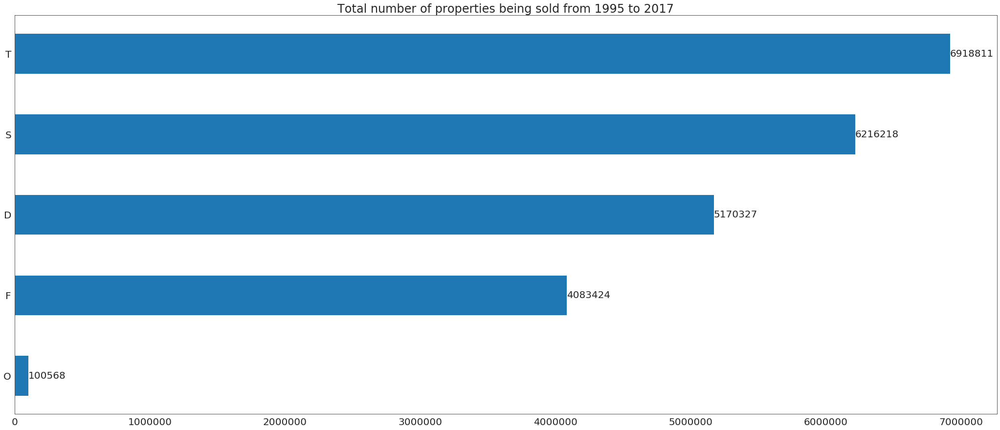

In [ ]:
property_types = housingprice_df.property_type.value_counts()
verbar(property_types,title="Total number of properties being sold from 1995 to 2017")

### Price

The sale prices of properties were stated on the transfer deed. I didn't know the transfer deed until this project. It looks like this picture.

![](https://i.imgur.com/R3ffHXJ.png)

### The average housing prices in the dataset

In [ ]:
housingprice_df.price.mean()

178244.21208765145

### Mean V.S. Median housing prices

In [ ]:
# Groupby to get yearly median price
yearly_median_price=housingprice_df_price_trends.groupby('year')['price'].median()

# Rename them in a understandable fashion
yearly_average_price = yearly_average_price.rename('mean')
yearly_median_price = yearly_median_price.rename('median')

# Combine these two pandas seriess
yearly_comparsion = pd.concat([yearly_average_price,yearly_median_price],axis=1)

# Ploting line charts with Plotly library

fig = px.line(yearly_comparsion,title = 'Housing price Mean V.S. Median', color_discrete_sequence =['aquamarine','cornflowerblue'])

fig.update_layout(yaxis_title = 'Housing Price',legend_title='types',font_size=14)

fig.update_yaxes(rangemode='tozero')

fig.show()

Since the price is numerical countinous data type, it'd be interesting to know the distribution.

#### Outlier detection


In the financial world, outliers are inevitable. Asset prices are varying and fluctuating in the market. Some properties in London could be ridiculously expensive, whereas some in rural areas in the UK could be unbelievably cheap.

It is less accurate to represent housing prices with the mean price. Note, the [Michael Jordan Fallacy](https://jovian.ai/matcha-coding/zero-to-data-statistics-measures-of-central-tendency/v/1#C43)  affects the mean prices. Bear in mind, we're analyzing the housing market in the whole UK. Some properties could be sold at very high prices in London, whereas some properties might be sold at 1 pound in Liverpool. 

To detect outliers, we use the box plot using the random sampling technique. We look at the population by using this sampling technique as long as each sample has an equal chance to be picked up. By random sampling technique, we can roughly understand the shape of the whole dataset.


In [ ]:
housingprice_col = housingprice_df['price'].sample(frac=0.1)

In [ ]:

px.box(housingprice_col,y='price',title=" 10% Sample Housing Price Distribution")


Plotly enables us to see statistics by hovering the box plots. 

![Data source: simplypsychology.org](https://www.simplypsychology.org/boxplot.jpg)

#### Box plots basics

- Minimum Value

It's the minimum value at the end of the lower whisker.

- Maximum Value

It's the maximum value at the end of the upper whisker.

- Lower Quartile

The position of the lower quartile, also called the first quartile i.e. $Q_1$, means 25% of values is below the value of $Q_1$ (In our case, 25% of 10% samples < $Q_1$)

- Upper Quartile

The position of the upper quartile known as the third quartile  or $Q_3$,  means 75% of values is below the value of $Q_3$ (75% of 10% samples < $Q_3$ )

- Median 

Actually ,median is positioned as the second quartile , also known as $Q_2$, dividing the box into 2 parts. This means the scores are greater than or equal to this value and half are less. 

- Interquartile

The interquartile helps us focus on the middle of values. i.e. ( the range between the $Q_1$ and $Q_3$)

![](https://www.simplypsychology.org/boxplot-quartiles.jpg)


- Whiskers

We use the adjective words,**upper** and **lower**, to describe which whiskers regarding the minimum value and the maximum value. The  whiskers represent value outside the middle 50% (i.e. the lower 25% of values and the upper 25% of values for the dataset.


#### Explaination

In our case, we randomly selected 10% out of our dataset ,which is 2 million samples out of 22 million housing prices.

![](https://i.imgur.com/gvLM52Z.png)

As we can see the screenshots, the statistics from 10% samples are as follows:

- $\text{Max}$ = £98.9 million
- $\text{Min}$ = £1
- $Q_3$ = £412.5K
- $\text{Median}$ = £130K
- $Q_1$ = £75K
- $IQR$ = £337.5




#### What do these all mean?

After the random sampling, we aimed to grab a basic sense of the population for the dataset.

We know the maximum value is £98.9 million and the minimum value is £1. However, this doesn't mean there is only 1 data point for £98.9 million. Multiple house prices could be equal to £98.9 million.

Next, we know the third quartile is £412.5K. This means in the sample dataset, 75% of housing prices are below £412.5K. In contrast, the first quartile is £75K meaning 25% of housing prices is below £75k. 





### Duration

>Duration relates to tenure. 

In the UK, freehold and leasehold are common types for tenure.

My understanding of the difference between freehold and leasehold is the portion of ownership. Freeholders own the land and the property built upon on the land completely, whereas leaseholders can be multiple and own a portion of right to use the property where they have to agree on certain action such as lending for the commerical use.

You can find out more in this article [Leasehold vs freehold: What’s the difference?](https://www.moneyadviceservice.org.uk/en/articles/leasehold-or-freehold-financial-implications)

In [ ]:
sort_values(axis=0,ascending=True)

In [ ]:
duration_s = housingprice_df.groupby('duration').duration.count()
duration_s

duration
U         680
L     5312258
F    17176410
Name: duration, dtype: int64

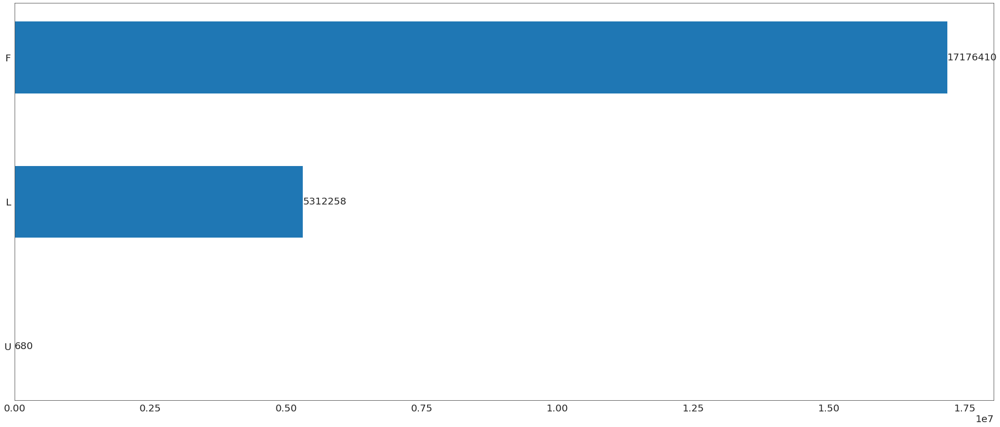

In [ ]:
verbar(duration_s)

You might wonder why I didn't mention the **"U"**. I had looked at the description on the dataset and UK GOV website but I had no luck to get any information. Hence, I wouldn't use this column for a further analysis. Yet, it's okay to drop **"U"** in my opnion.

### Old/New type

This category `Old/New` indicates the age of properties and applies to all paid price transactions, residential and non-residential. 

However, we do not know specific properties' age in this dataset as we have no information about the definition of a property as old or new by the HM Land Registry.

-`Y` refers to  **a newly built property**

-`N` refers to **an established residential building**


In [ ]:
housingprice_df['old/new'].unique()

['N', 'Y']
Categories (2, object): ['N', 'Y']

In [ ]:
oldnew_s = housingprice_df['old/new'].value_counts()
oldnew_s

N    20192676
Y     2296672
Name: old/new, dtype: int64

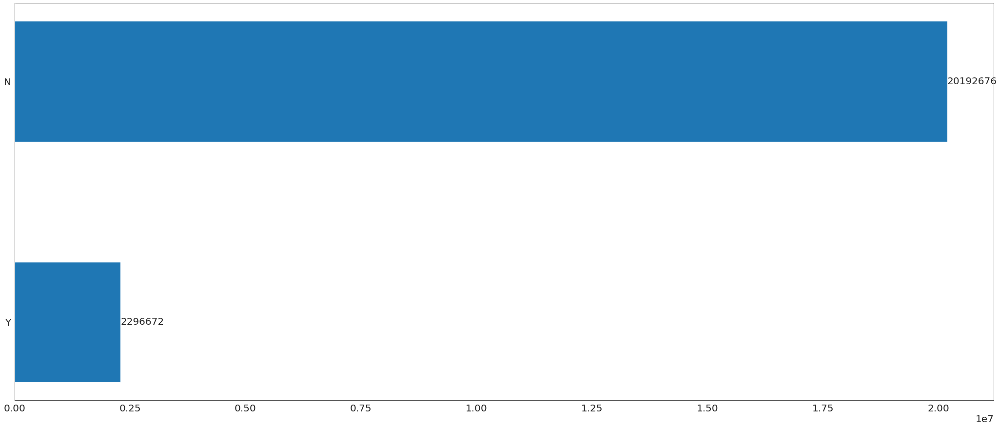

In [ ]:
verbar(oldnew_s)

### PPDCategory Type

On Kaggle, it does not demonstrate the importance of this category. The limited information is 

>PPD Category Type is the type of Price Paid Transaction




In [ ]:
housingprice_df['ppdcategory_type'].unique()

['A', 'B']
Categories (2, object): ['A', 'B']

Having done some google, I found out the documentation on the UK GOV website. [Link](https://www.gov.uk/guidance/about-the-price-paid-data#data-excluded-from-price-paid-data)

>A = Standard Price Paid entry, includes **single residential property** sold for **value**.

>B = Additional Price Paid entry including transfers under a power as follows:

- **sale/repossessions**
- **buy-to-let** (where they can be identified by **a Mortgage*) 
- **transfers to non-private individuals**.

Note that category B does not separately identify the transaction types stated.

HM Land Registry has been collecting the information on **Category A transactions from January 1995.** **Category B transactions were identified from October 2013.**


This information about collecting Category B was identified after October, 2013. It could be confusing to see the accuracy inconsistent if the project was building machine learning projects. In this case, the column containing category wouldn't in use since the project mainly focuses on visualization.

In [ ]:
ppd_s = housingprice_df['ppdcategory_type'].value_counts()
ppd_s

A    22141173
B      348175
Name: ppdcategory_type, dtype: int64

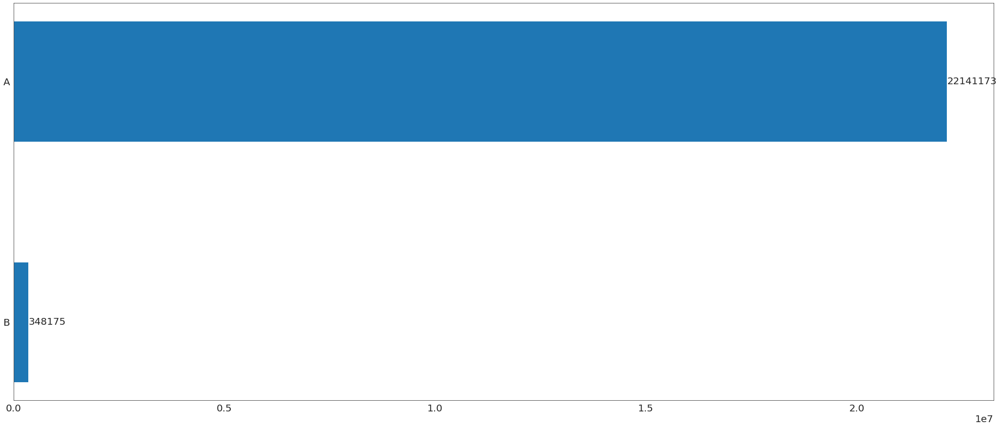

In [ ]:
verbar(ppd_s)

### Record Status

It demonstrates monthly files only Indicates additions, changes and deletions to the records. The categories are A, C, D

- A = Addition
- C = Change
- D = Delete

>Note that where a transaction changes category type due to misallocation (as above) it will be deleted from the original category type and added to the correct category with a new transaction unique identifier.

In [ ]:
housingprice_df['record_status_-_monthly_file_only'].unique()

['A']
Categories (1, object): ['A']

In this dataset, we only have a category of A.

In [ ]:
housingprice_df['record_status_-_monthly_file_only'].value_counts()

A    22489348
Name: record_status_-_monthly_file_only, dtype: int64

Then, we can drop this column `record_status_-_monthly_file_only`. Because it doesn't provide any addition information but only the method for the data collection.

In [ ]:
housingprice_df=housingprice_df.drop(columns='record_status_-_monthly_file_only')

### Location

As I'm from China, I taught myself geography knowledge about the UK. 

- Britain consists of four countries: England, Scotland, Wales and Northern Ireland. 

- England is divided into 48 ceremonial counties. Scotland was divided into 33 counties, Wales has 22 counties, and Northern Ireland has 6 counties.

- Each county has their cities and towns. On Wikipedia, places had been granted city status by letters patent or royal charter. There are currently a total of 69 such cities in the United Kingdom: 51 in England, 7 in Scotland, 6 in Wales, and 5 in Northern Ireland.

In China, we don't use the term "county", while we say "province" to refer to "country". 

Source:[https://www.wikiwand.com/en/List_of_cities_in_the_United_Kingdom#:~:text=There%20are%20currently%20a%20total,and%20five%20in%20Northern%20Ireland.](https://www.wikiwand.com/en/List_of_cities_in_the_United_Kingdom#:~:text=There%20are%20currently%20a%20total,and%20five%20in%20Northern%20Ireland.)


#### Hierarchical Representation of UK Statistical Geographies

![](https://miro.medium.com/max/2846/1*N8V2hbvy2oVEGYp5epQ00A.jpeg)


#### Note

However, the dataset does not contain any infromation about Scottland, Northern Ireland.

>Note:
>
>However, the dataset does not contain any information about Scottland, Northern Ireland.

I put the codes about the actual map into another notebook avoding the confusion. You can have a look here: [https://jovian.ai/shenghongzhong/the-geography-of-the-uk](https://jovian.ai/shenghongzhong/the-geography-of-the-uk)

In [ ]:
#Check the unique cities
city = housingprice_df['town/city'].unique()
city

array(['Oldham', 'Grays', 'Highbridge', ..., 'Thornhill', 'Billinghurst',
       'Gatwick'], dtype=object)

In [ ]:
print("There are {} cities or towns in this dataset".format(len(city)))

There are 1170 cities or towns in this dataset


### Mapping house sales data with England&Wales

### Data Cleaning

People say data scientists spend 70% of time into cleaning data. They are absolutely right. 

We rarely use just a dataset from a data source. If we want to create interesting insights, and then we would probably use another type of dataset. e.g. we might use the population statstics from the World Organization. 

In this case, we may want to see how the UK population can be associated with the housing market, and then we can download the Census data to marege, join, concatenate datasets. 

In [ ]:
#To get the total number of house sales by county in the UK
county_loc_df = housingprice_df['county'].value_counts().reset_index()

#Create a new dataframe for the district
new_df = housingprice_df['district'].value_counts().reset_index()
new_df = new_df.rename(columns={'index':'lad19nm','district':'count'})

# Convert the house sales dataset all into lower cases
new_df['lad19nm'] = new_df['lad19nm'].str.lower()

# Download GEOjson data from the UK GOV
from urllib.request import urlretrieve
from urllib.request import urlopen
url='http://geoportal1-ons.opendata.arcgis.com/datasets/1d78d47c87df4212b79fe2323aae8e08_0.csv?outSR={%22latestWkid%22:27700,%22wkid%22:27700}'
urlretrieve(url,'district.csv')

#Read data and convert them into lower cases
out_district_df = pd.read_csv('district.csv')
out_district_df['lad19nm'] = out_district_df['lad19nm'].str.lower()

#Combine the dataset
combine_df = pd.merge(out_district_df,new_df,on='lad19nm',how='left')



We have 56 missing data which doesn't matched.

In [ ]:
combine_df.isnull().sum()

objectid           0
lad19cd            0
lad19nm            0
lad19nmw           0
bng_e              0
bng_n              0
long               0
lat                0
st_areashape       0
st_lengthshape     0
count             56
dtype: int64

In [ ]:
# Handling missing data
combine_df = combine_df.fillna(0)
# Check the number of unmatched data
to_check = combine_df[combine_df['count']==0]

My cleanning strategy is to focus on GEOjson data first as the main dataframe, since it'd take a long time to get the complete GEOjson data.

Due to the limited time, I decided to hold on to get enough data for the map by checking each columns from the housing sale dataset such as `town/city`, `county`, `district`. Some data would be dropped if there was no matched data. It'd take too long to research. As long as we can cover the whole dataset roughly, it should be fine.

In [ ]:
#check the data
town_city = housingprice_df['county'].value_counts().reset_index()
town_city['index'] = town_city['index'].str.lower()

Having spent time and efforts to clean data, I had successfully come up with a clean version data with sales data in it. The name of data is called  `cleaned_data_cleaning_for_foilum_v2_for_use.csv`. 

#### Plotting on the map

In [ ]:
#Load GeoJson 

with urlopen('http://geoportal1-ons.opendata.arcgis.com/datasets/1d78d47c87df4212b79fe2323aae8e08_0.geojson?outSR={%22latestWkid%22:27700,%22wkid%22:27700}') as response:
    uk_geo = json.load(response)

#Load data to be charted    
data = pd.read_csv('https://gist.githubusercontent.com/Shenghongzhong/7313a75633a6a21822f5461490279971/raw/75b493ff8a208d4570848b55647134499b8dfdbc/cleaned_data_cleaning_for_foilum_v3_for_use.csv')

#With Folium
import folium

uk_map = folium.Map(tiles='cartodbpositron',location=[54.38, -2.7], zoom_start = 6.499)

folium.Choropleth(
    geo_data=uk_geo,
    name="choropleth",
    data=data,
    columns=["lad19cd", "per"],
    key_on="feature.properties.lad19cd",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="House Sales by District",
).add_to(uk_map)
folium.LayerControl().add_to(uk_map)

#uk_map
uk_map.save('#292_folium_chloropleth_12_year_analysis_England_Wales.html')


### Environment issues

Due to the enviornment in Google Colab, the  choropleth UK map wasn't shown.Instead, I showed a screenshot below. But you can open the html file in browser if you prefer. You can download it by clicking the icon folder on the side bar of your left side.

![](https://i.imgur.com/mooUM14.png)


## Ask questions and answer

### 1. What’s the total number of houses in the UK being sold since 1995 till 2017

In [ ]:
# Sum all data 
total_housesold = housingprice_df['town/city'].value_counts().sum()

print("The total number of properties being sold is {}m + from 1995 to 2017".format(int(total_housesold/1e6)))

The total number of properties being sold is 22m + from 1995 to 2017


As mentioned earlier, each house sales generates an unique idenitifer for a deal. However, we won't know if a house selling twice or not regarding the identifier with the limited information.

### 2. What're the top 10 cities regarding the house sales from 1995 to 2017

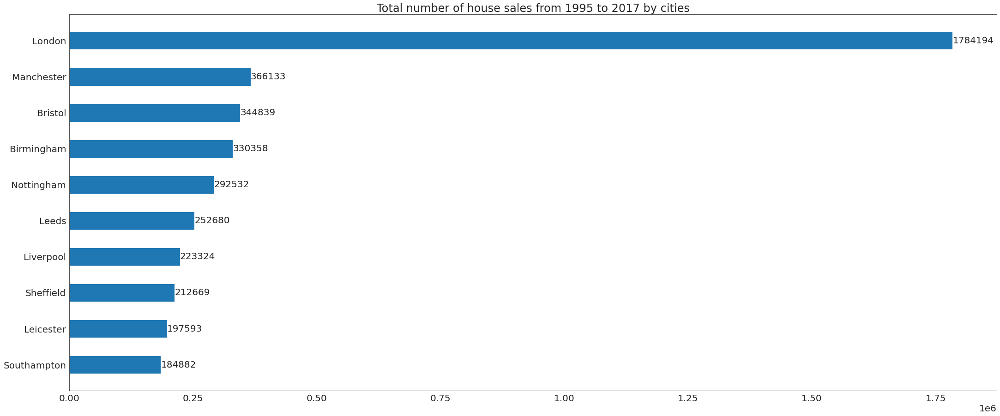

In [ ]:
#Selected top 10
top_10_soldhouse = housingprice_df['town/city'].value_counts().head(10)

#sorting value
top_10_soldhouse = top_10_soldhouse.sort_values(axis=0,ascending=True)

#using helper function
verbar(top_10_soldhouse,title="Total number of house sales from 1995 to 2017 by cities")

As shown in the picture, the house being sold the most is in London.

Besides London, there were cities like Manchester, Bristol and Birmingham following with London. I can't really know by just looking at the dataset I have. It could be policies that attracting migration or cheaper expenses of living. 
Another interesting point is out of the top 10 cities, 5 places are in the North of England, i.e. Nottingham, Leeds, Liverpool, Sheffield, Leicester. I'm intrigued to know the population growth over years in these places.

In [ ]:
#Processing the percentage
top_10_soldhouse_percentage=(housingprice_df['town/city'].value_counts()/total_housesold).head(10).to_frame()
#Examine the percentage of house sales in London
percent_london = top_10_soldhouse_percentage.loc["London"][0]
print("The percentage of houses being sold in London is {:.2f} % from 1995 to 2017".format(percent_london*100))

The percentage of houses being sold in London is 7.93 % from 1995 to 2017


### 3. What’s the most popular property type of houses being sold between 1995 and 2017 in London?




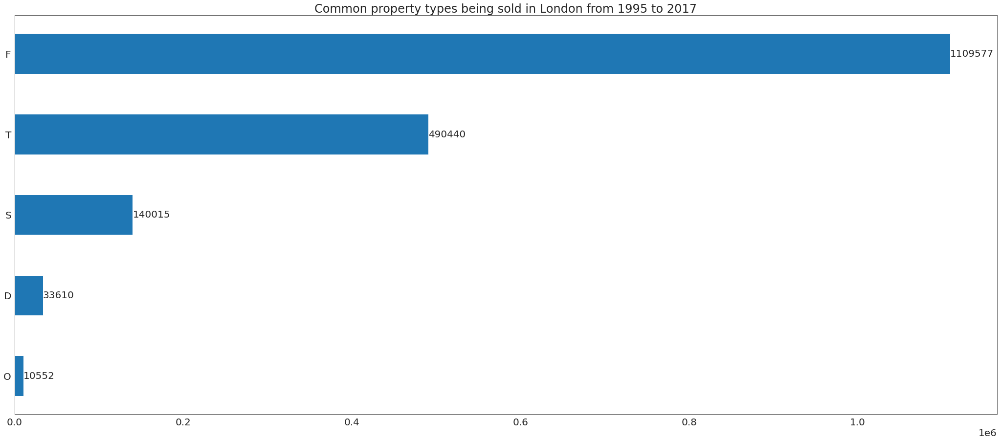

In [ ]:
# Assign value to a new variable
property_london = housingprice_df[housingprice_df['town/city']=='London']

# Use Groupby
property_london_type = property_london.groupby('property_type')['transaction_unique_identifier'].count()

#Plotting
verbar(property_london_type,title='Common property types being sold in London from 1995 to 2017')



#### Analysis

In London, flat is the most popular property type from 1995 to 2017 in this dataset. I was wondering if the flat had had been always popular?

So I plotted another type of visualization to validate my idea.

###  4. Was the flat in London always popular from 1995 to 2017?

Boxplot and Heatmap by property type and years in the UK

In [ ]:
#Group property type for creating pivot table
tem_df = property_london.groupby(['property_type','year','month'])['transaction_unique_identifier'].count()
tem_df = tem_df.reset_index()

#Narrow down to the flat type
flat_london = tem_df[tem_df['property_type'] =='F']

#Plot box plot
sample = flat_london.sample(frac=0.1)
fig = px.box(sample, x="property_type", y="transaction_unique_identifier")
fig.update_layout(
    title = ' The box plot for flat sales in london',
    yaxis_title = '10% Sample of housing sales'
)
fig.show()

We can see the median of flat sales over years is 3755. This helps us evalue the heatmap.

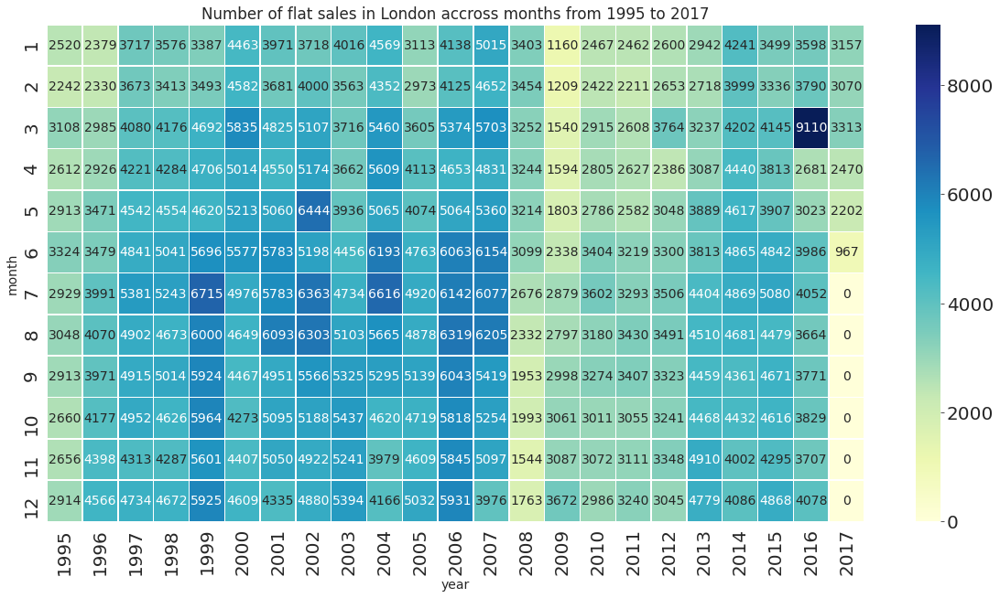

In [ ]:
#Group property type for creating pivot table
tem_df = property_london.groupby(['property_type','year','month'])['transaction_unique_identifier'].count()
tem_df = tem_df.reset_index()

#Narrow down to the flat type
flat_london = tem_df[tem_df['property_type'] =='F']
#Create a pivot table
flat_london_pivot = flat_london.pivot('month','year','transaction_unique_identifier')

#Plot setting
sns.set_style("white")
matplotlib.rcParams['font.size'] = 14
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20)
matplotlib.rcParams['figure.figsize'] = (20,10)

# Plot into a heatmap
plt.title("Number of flat sales in London accross months from 1995 to 2017")

sns.heatmap(flat_london_pivot, annot=True, fmt="d",linewidths=.5,cmap="YlGnBu");

### Analysis

We can find out the pattern of successful deals. They were likely to happen from May to August excluding the outlier March in 2016. However, this might be the influence of Brexit where lots of business might be planning to reloacte.

From the box plot, we understand the median sale figure is 3755. And we know there were 272 months in total in the datset, and yet 162 months(59% of the time) over the median value of flat sales. We can fairly say the flat was popular in a half time. 

### 5. What were monthly housing sales trends over years?

Let's look at the housing sales regarding the line chart.

In [ ]:
from datetime import datetime
import plotly

# Create day-wise element list from Jan 1995 to Dec 2017

daterange = pd.date_range('1995-01-01','2017-06-30', freq = '1M')

# Use Groupby to calculate the number of sales of each month

fulldatafortimeplot = housingprice_df.groupby([housingprice_df['year'],housingprice_df['month']])['transaction_unique_identifier'].count()

# Combine two data frame and select what we need to plot monthly price trends
fulldatafortimeplot2 = fulldatafortimeplot.reset_index()
fulldatafortimeplot2['Dates'] = daterange
fulldatafortimeplot2 = fulldatafortimeplot2.rename(columns={'transaction_unique_identifier':'Count'})

# Plot.ly Timeline plot with range slider
trace_time = go.Scatter(
    x=fulldatafortimeplot2['Dates'],
    y=fulldatafortimeplot2['Count'],
    name = "Total Number of House Sales",
    line = dict(color = '#61c0cc'),
    opacity = 0.8)

data_timline = [trace_time]

layout_timeline = go.Layout(
    dict(
    title=' Total Number of House Monthly Sales in the UK between 1995 and 2017',
    xaxis=dict(

        rangeslider=dict(),
        type='date'
    ),
    annotations = [
        dict(
        x = datetime.strptime('23-06-2016', '%d-%m-%Y'),
        y = 84927,
        xref = 'x',
        yref = 'y',
        text = 'UK Referendum',
        showarrow = True,
        arrowhead = 7,
        ax = 0,
        ay = -40
        ),
        dict(
        x = datetime.strptime('01-12-2007', '%d-%m-%Y'),
        y = 104283,
        xref = 'x',
        yref = 'y',
        text = 'Financial Crash',
        showarrow = True,
        arrowhead = 7,
        ax = 0,
        ay = -40
        )
    ]

)
)




fig = dict(data=data_timline, layout=layout_timeline)
plotly.offline.plot(fig, filename = 'Monthly House Sales Over Years.html', auto_open=False)

'Monthly House Sales Over Years.html'

![](https://i.imgur.com/AZGKTa9.png)

Due to the massive amount of data to be plotted, Google Colab will be crashed by rendering the whole HTML page. Instead, the solution is to save it as an HTML file. Check it when you need it.

Let's continue to investigate why house sales were soaring in March 2016 by plotting monthly sales. After investigation, my inference is Brexit. British people started to vote for leaving the EU or not around March which created an uncertain expectation towards the future of the United Kingdom. The business was planning to start to relocate which is one of my conclusion

###6. How many new houses versus old houses were being sold every year?

-Y refers to a newly built property

-N refers to an established residential building

In [ ]:
# Group dataframes by new and old house
old_new_df= housingprice_df.groupby(['year','old/new'])['transaction_unique_identifier'].count()
tem_df = old_new_df.reset_index()
old_new_df = tem_df.rename(columns={'transaction_unique_identifier':"count"})

# Filter and construct dataframes for plotting
old = old_new_df[old_new_df['old/new']== 'N']['count']
new = old_new_df[old_new_df['old/new']=='Y']['count']
years = np.arange(1995,2018)


#Plotting with plotly
fig = go.Figure(data = [go.Bar(name='Estabilished residential building',x=years,y=old),
                go.Bar(name="Newly built property",x=years, y=new)]
                               )

fig.update_layout(barmode='stack',title='Total number of old houses sales versus new house sales over years',xaxis=dict(tickmode='linear'))
fig.show()

### Analysis

The stacked bar chart shows the total number of house sales by the old&new type across years.

Between 1995 to 2007, the house sales were fluctuating in general and remained high at around 1.2 million house sales.

Next, this followed by a big drop in 2008. One of the explanations was the UK housing market was affected by the Financial Crisis. In 2008, the house sales were decreased by 48% in house sales compared to 2007 and followed by levelling off in house sales between 2010 to 2012.

However, the housing market recovered as the house sales went up since 2013.

**Note**
The dataset only provided data to the date of June 30th 2017 


###7. What was the monthly performance of houses being sold over years?


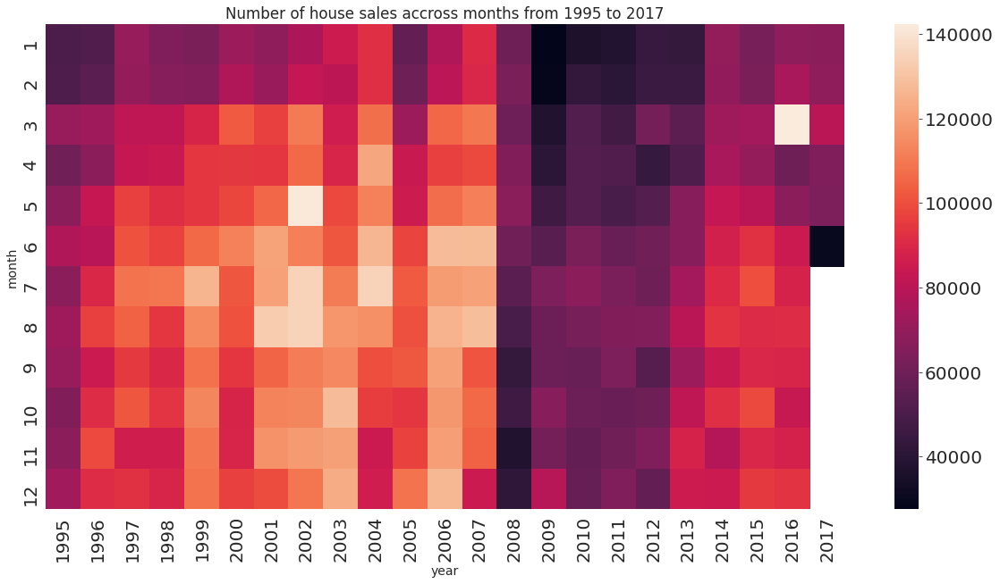

In [ ]:
#Group by years and months of house sales
tem_df = housingprice_df.groupby(['year','month'])['transaction_unique_identifier'].count()
tem_df = tem_df.reset_index()
tem_df = tem_df.rename(columns={'transaction_unique_identifier':"count"})
# create a pivot table
monthly_popular_property = tem_df.pivot("month","year","count")

# Plot into a heatmap
plt.title("Number of house sales accross months from 1995 to 2017")
sns.heatmap(monthly_popular_property );

 ### Analysis

You can see colors of the house sales from 2008 to 2013 is very dark. It suggests that during the Financial Crisis, a few people were selling properties. From June 2008 to June 2009, the colour pattern is dark continously. 

Also, seemly there may be a pattern where January seems not a good month to selling houses.

Let's reflect on the price trend chart.

![](https://i.imgur.com/fCHs7OB.png)

The line chart of housing prices shows, Since 1995, the housing prices in the UK went up and reached the highest point in 2007. Next, it followed by a slight drop in housing prices affected by the global financial crisis in 2008, it fell steadily but still similar level in 2006, then the price was bottom out in 2012.


### 8. Are there anywhere more old houses being sold than new houses or more new houses being sold than old houses?


In [ ]:
# Group by them
old_new_df= housingprice_df.groupby(['year','old/new'])['transaction_unique_identifier'].count()
tem_df = old_new_df.reset_index()
old_new_df = tem_df.rename(columns={'transaction_unique_identifier':"count"})

# Filter them and select count column
old = old_new_df[old_new_df['old/new']== 'N']['count']
new = old_new_df[old_new_df['old/new']=='Y']['count']
years = np.arange(1995,2018)

# Constructing bar charts
fig = go.Figure(data = [go.Bar(name='Estabilished residential building',x=years,y=old),
                go.Bar(name="Newly built property",x=years, y=new)]
                               )

fig.update_layout(barmode='group',title='Total number of houses sales by types over years',xaxis=dict(tickmode='linear'))
fig.show()

### Analysis

The short answer is no. There is no single year the number of new properties more than old properties regarding the dataset.

In this bar chart, I grouped new old property sales instead of stacking them to compare whether new property had a better sale performance.

However, the chart told us that every year there were old propery sales more than new property sales. 

**Note**

This excludes the incomplete data in the year of 2017 as the dataset didn't include housing prices after June 2017.



### 9. Over the years, what changes did counties have in terms of sales?

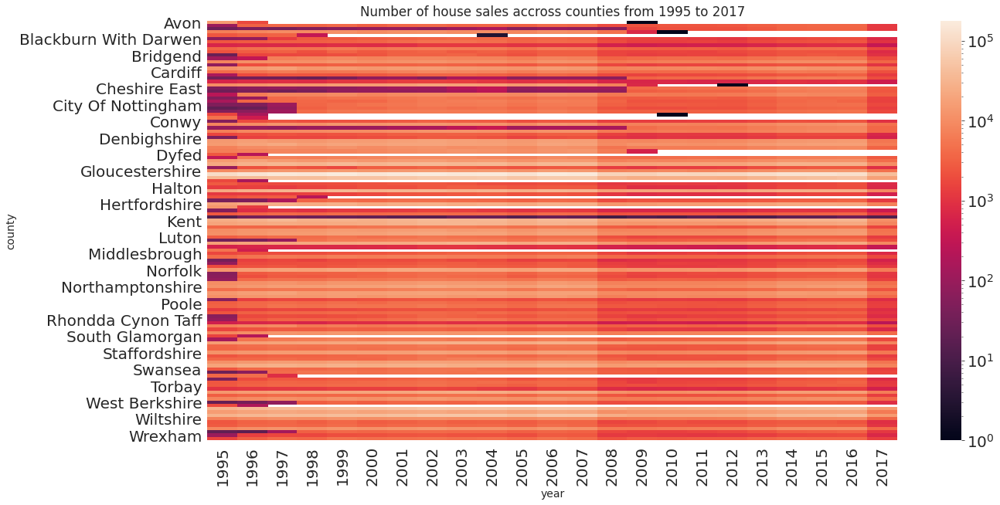

In [ ]:
#Prepare data for plotting
counties_df = housingprice_df.groupby(['county','year'])['transaction_unique_identifier'].count()
counties_df = counties_df.reset_index()
counties_df = counties_df.rename(columns={'transaction_unique_identifier':'count'})

#Filling in with 0 because some counties might not have sales
counties_heatmap = counties_df.pivot('county','year','count').fillna(0)


# Plot heatmap with log scale 
from matplotlib.colors import LogNorm
plt.title("Number of house sales accross counties from 1995 to 2017")
sns.heatmap(counties_heatmap, norm=LogNorm());

### Analysis

House sales by counties over years gave us another picture. Using a log scale could allow us to see changes over years clearly.

Kent is the county close to London as many people commute to London for work and live outside London. Kent is a popular place as we can see the level of house sales. those counties nearby London were generally popular such as Surrey. Also, we can see the popularity of Greater Manchester had been increasing. 

Also, we can see the popularity of Greater Manchester had been increasing. I noticed the property sales performance in Yorkshire had been very strong over years. I was wondering if this was something associated with the population growth?


###10. What’s the minimum/maximum price of houses being sold given years

In [ ]:
# Group by data to get max/min price per year
max_by_year = housingprice_df.groupby('year')['price'].max().reset_index()
min_by_year = housingprice_df.groupby(['year'])['price'].min().reset_index()

# Find the Maximum and minimum price
max_price = max_by_year['price']
min_price= min_by_year['price']
years = np.arange(1995,2018)

In [ ]:
trace_1 = go.Scatter(x=years, y=max_price, name='Max housing price', line=dict(color = ('royalblue')), mode='lines+markers')

trace_2 = go.Scatter(x=years, y=min_price, name='Min housing price', line=dict(color = ('orange')), mode='lines+markers')

layout_1 = go.Layout(
        height=420,
        width=800,

        title=go.layout.Title(
            text='The maximum and minimum housing prices in the UK over years',
        ),
        xaxis=go.layout.XAxis(
            title='years',
        ),
        yaxis=go.layout.YAxis(
            title='Housing Price(£)',
        )
    )

data = []
trace_3_arr = np.array([])

for i in range(0, len(years)):
  trace_i = go.Scatter(x=[years[i], years[i]], y=[max_price[i], min_price[i]], line=dict(color = ('black'), width=1), showlegend=False)
  trace_3_arr = np.append(trace_3_arr, trace_i)
  data.append(trace_i)


data.append(trace_1)
data.append(trace_2)

fig = go.Figure(data=data, layout=layout_1)
iplot(fig)

### Analysis

From the chart, we can see the minimum price could vary. They are £1 and £100. However, we see the maximum price reached the highest point of £98.76 million.

#### Maximum price property

Having googled, I found out the most expensive property in 2016 was this mansion located in central London.[Link](https://themovemarket.com/tools/propertyprices/76-maida-vale-london-w9-1pr)

![](https://i.imgur.com/bt1qRpH.png)


#### One pound houses

I don't know about you but I was very intrigued by one pound houses. My first reaction was " What? £1 for a property in the UK??" It couldn't be wrong anymore.

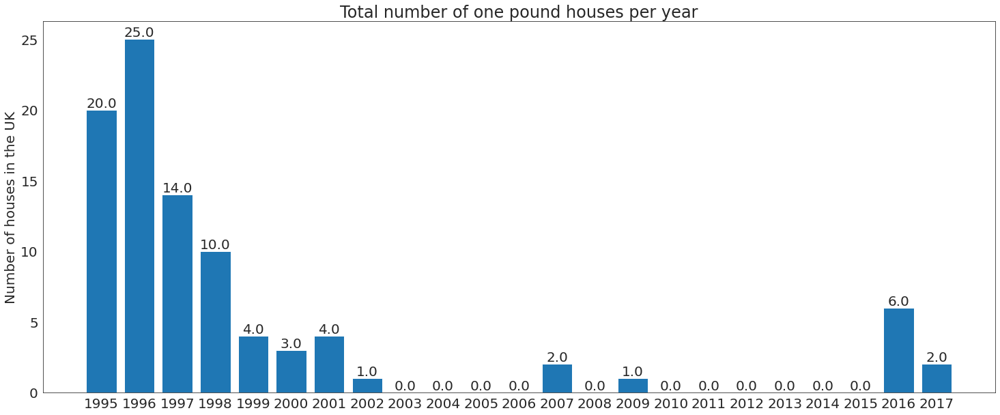

In [ ]:
tem_df = housingprice_df[housingprice_df['price']==1]
tem_df = tem_df['year'].value_counts().reset_index()
one_pound_df = tem_df.rename(columns={'index':'year',"year":"count"})

# Construct a new dataframe for the merge
year = pd.DataFrame({'year':np.arange(1995,2018)})

#Merge them into one DataFrame
one_pound_df = pd.merge(year,one_pound_df,how='outer')

#Fill in 0 with missing values
one_pound_df = one_pound_df.fillna(0) 

#Plot a bar chart for the number of one pound houses per year
y=one_pound_df['year']
x=one_pound_df['count']

fig,ax = plt.subplots(figsize=(25,10))
bars = ax.bar(y,x)
ax.set_xticks(y);
ax.set_ylabel('Number of houses in the UK',fontsize=20)
ax.title.set_text('Total number of £1 houses per year')
ax.set_title('Total number of one pound houses per year',fontsize=24);


for bar in bars:
  height = bar.get_height()
  label_x_pos = bar.get_x() + bar.get_width()/2
  ax.text(label_x_pos,height,s=f'{height}',ha='center',va='bottom',fontsize=20)

### Analysis


Since we have statistics for the one pound houses, there were quite many one pound houses. I started to brainstorm before my investigation. 


#### Parents' gifts

I heard lots of parents in the UK gave gifts to their children. Maybe they sent a house to their children. 

#### Divorce

I heard the divorce rate in the UK was quite high. So I wouldn't be surprised for this reason. 

#### Companies bankrupt

Running a business is hard so the biggest risk is to lose the company. When the company went bankrupt, they would sell some properties to somewhere else or bank if they loaned money from banks with collaterals.

#### Avoiding taxes

Possible. But I believe UK GOV would have sort of systems, experts to recognize  unfavourable economy behaviour. 


#### Mistakes

It happened sometimes. Humans make mistakes in  data entry. 

https://www.gov.uk/government/statistical-data-sets/price-paid-data-downloads



While I exhausted all reasons, I started to find the data source on the UK GOV. [https://www.gov.uk/guidance/about-the-price-paid-data#data-excluded-from-price-paid-data](https://www.gov.uk/guidance/about-the-price-paid-data#data-excluded-from-price-paid-data)

So all my assumptions were defeated after examing the description of how UK GOV processed the dataset I used.

![](https://i.imgur.com/jwMHEFa.png)


#### Continue Researching the myth of £1 houses

Besides those reasons I listed, properties being sold at £1 would never happen in China, in my opinion. Chinese people see properties as the most valuable investment. They would rather hold them and put properties aside until the housing market becomes a bull market.

Having continued my investigation, I found out actually the GOV in Liverpool tried to solve the housing crisis by launching **One Pound House Scheme** years ago. 

Furthermore, they made documentary films!

![](https://i.imgur.com/AVEAGTG.png)

>The one-pound ($1.25) homes program run by Liverpool City Council - the subject of a new TV documentary - is one of a handful of schemes by cities across Britain and Europe searching for innovative ways to solve housing crises.
>Selling homes for token sums has become a popular, last-ditch strategy for towns, cities and villages fighting depopulation and decay.

However, I still found there were some £1 in London.If this interests you, you can download the dataset to continue my investigation:)



### 11. Out of the top 10 house sales cities , what're the common property types ?







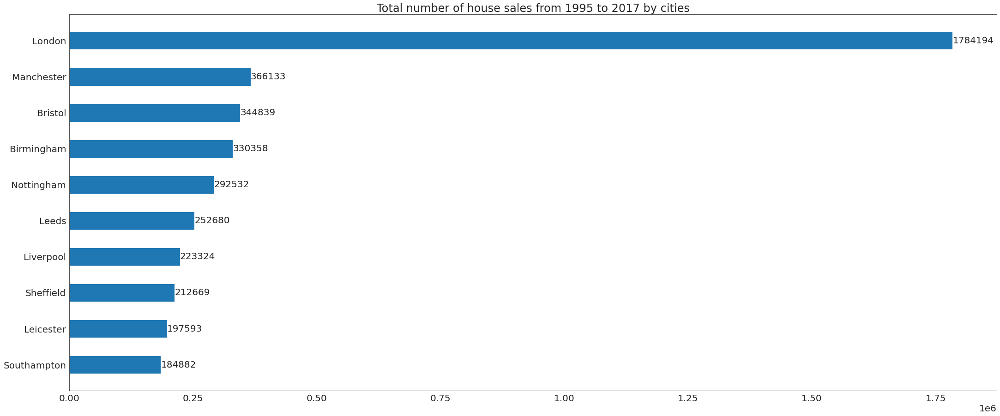

In [ ]:
verbar(top_10_soldhouse,title="Total number of house sales from 1995 to 2017 by cities")

In [ ]:
#import regex package
import re

#Constructing a list
top_10_city = ['London','Manchester','Bristol','Brimingham','Nottingham','Leeds','Liverpool','Sheffield','Leicester','Southampton']

#Filter out them
top_ten_df = housingprice_df[housingprice_df['town/city'].str.contains('|'.join(top_10_city ),flags=re.IGNORECASE,regex=True) ]

#Constructing dataframe
top_ten_bytype_df = top_ten_df.groupby(['property_type','town/city'])['transaction_unique_identifier'].count().reset_index()

#Create  Pivot table
top_ten_pivot_bytype = top_ten_bytype_df.pivot('town/city','property_type','transaction_unique_identifier')

#Calculate the total number and append the empty list
emp_list = []
for i in range(len(top_ten_pivot_bytype)):
  emp_list.append(top_ten_pivot_bytype.iloc[i].sum())

#Add a categorical column
top_ten_pivot_bytype.columns = top_ten_pivot_bytype.columns.add_categories('total_number')
#Assign values to the column
top_ten_pivot_bytype['total_number'] = emp_list

# Sorting value by the total number
top_ten_pivot_bytype = top_ten_pivot_bytype.sort_values('total_number')


# Helper function
def calculate_percentage(df):
  new_df = df.copy()
  lens= new_df.columns.to_list()
  for i in range(len(lens)):
    new_df.iloc[:,i] = new_df.iloc[:,i]/new_df.iloc[:,-1]
  new_df = new_df.iloc[:,:-1]
  return new_df


# Convert data into right format
top_ten_pivot_bytype.columns = top_ten_pivot_bytype.columns.to_list()
top_ten_pivot_bytype = top_ten_pivot_bytype.reset_index()
top_ten_pivot_bytype = top_ten_pivot_bytype.rename(columns={'town/city':'location'})


In [ ]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Bar(
    y=top_ten_pivot_bytype['location'] ,
    x=top_ten_pivot_bytype['D'],
    name='Detached House',
    orientation='h',
    marker=dict(
        color='#194350',
        #line=dict(color='rgba(246, 78, 139, 1.0)', width=3)
    )
))

fig.add_trace(go.Bar(
    y=top_ten_pivot_bytype['location'] ,
    x=top_ten_pivot_bytype['F'],
    name='Flat',
    orientation='h',
    marker=dict(
        color='#ff8882',
        line=dict(color='rgba(246, 78, 139, 1.0)', width=3)
    )
))

#Semi-detached
fig.add_trace(go.Bar(
    y=top_ten_pivot_bytype['location'] ,
    x=top_ten_pivot_bytype['S'],
    name='Semi-Detached House',
    orientation='h',
    marker=dict(
        color='#810000',
        #line=dict(color='rgba(246, 78, 139, 1.0)', width=3)
    )
))

#Terraced 
fig.add_trace(go.Bar(
    y=top_ten_pivot_bytype['location'] ,
    x=top_ten_pivot_bytype['T'],
    name='Terraced House',
    orientation='h',
    marker=dict(
        color='#51c4d3',
        #line=dict(color='rgba(246, 78, 139, 1.0)', width=3)
    )
))

fig.add_trace(go.Bar(
    y=top_ten_pivot_bytype['location'] ,
    x=top_ten_pivot_bytype['O'],
    name='Others',
    orientation='h',
    marker=dict(
        color='#f21170',
        #line=dict(color='rgba(246, 78, 139, 1.0)', width=3)
    )
))


fig.update_layout(barmode='stack',title ='The total number of top 10 house sales cities by property type' )
fig.show()

In [ ]:
#Calculate the values 
emp_list = []

for i in range(len(top_ten_pivot_bytype.columns)):
  if i == 0:
    emp_list.append('total_number')
  else:
    col_sum = top_ten_pivot_bytype.iloc[:,i].sum()
    emp_list.append(col_sum)

#Insert the row into the
top_ten_pivot_bytype.loc[9] = emp_list


# Draw pie chart
import plotly.graph_objects as go

fig = go.Figure(go.Pie(
    values = top_ten_pivot_bytype.iloc[9,1:6],
    labels = ["Detached House", "Flat", "Semi-Detached House", "Terraced House",'Other'],
    texttemplate = "%{label}:  <br>(%{percent})",
    textposition = "inside"))

fig.update_layout(
    title='The percentage of top 10 house sales cities by property type'
)
fig.show()

### Analysis

The pie chart shows the most popular property type is flat in the top 10 house sales cities, whereas terraced houses is being sold the most for the entire dataset.

I was wondering if there was a correlation between the population over England and Wales and the top 10 cities.

We could look at flat sales if we consider the property investment for the purpose of reselling in the future.

On the other hand, detached houses were accounting for 10.5%, whereas semi-detached houses are 21.2%. I wonder if the price can be the main factor for this difference, as prices for detached houses are generally more expensive.

In [ ]:
# Select two property types
desired_property_type = ['S','D']

semi_and_detached = top_ten_df[top_ten_df['property_type'].str.contains('|'.join(desired_property_type ),flags=re.IGNORECASE,regex=True) ]

#Plotting box plot
sample = semi_and_detached.sample(frac=0.1)
fig = px.box(sample, x="property_type", y="price")
fig.update_layout(
    title = ' Semi-detached house V.S. Detached house in top 10 house sales cities',
    yaxis_title = '10% Sample of housing prices'
)
fig.show()

In the box plot, we can see clearly the median price of detached houses is higher than the semi-detached house. It's not that surprising because a detached house is in general bigger than a semi one. However, knowing the price range is very helpful. At least, we can answer a specific question "How large is large?"

Let's look at the $Q_3$. 

Semi-detached had $Q_{3S}$ of £187K, comparing with the detached house having $Q_{3D}$ of £285K. That's  a 52% difference between these $Q_3$!

### 12. In terms of property type flat, what's the ratio for new/old flats among the top 6 flat sales cities?


- Y refers to a newly built property
- N refers to an established residential building

#### Plotting total number of flat sales

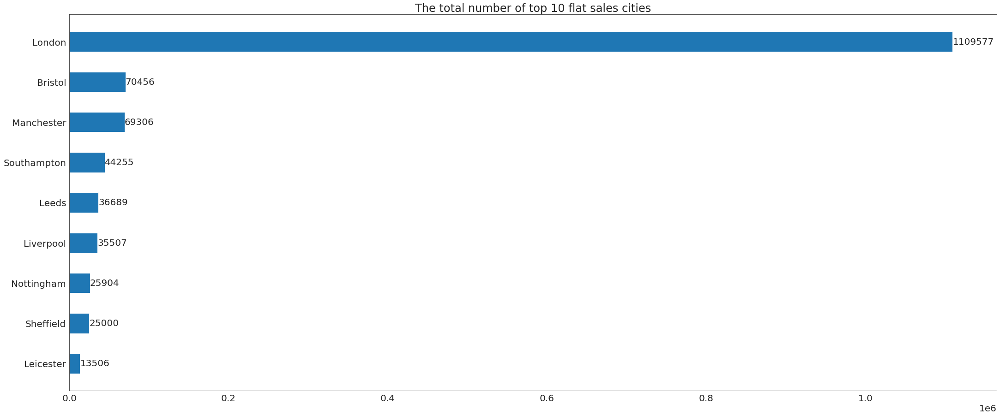

In [ ]:
#import regex package
import re

#Constructing a list
top_10_city = ['London','Manchester','Bristol','Brimingham','Nottingham','Leeds','Liverpool','Sheffield','Leicester','Southampton']

#Filter out them
top_ten_df = housingprice_df[housingprice_df['town/city'].str.contains('|'.join(top_10_city ),flags=re.IGNORECASE,regex=True) ]

#fliter flat type
top_ten_flat = top_ten_df[top_ten_df['property_type'] =='F']

#Process
top_ten_flat = top_ten_flat['town/city'].value_counts()
#Plotting horizontal bar chart
verbar(top_ten_flat,title='The total number of top 10 flat sales cities')
top_ten_flat = top_ten_flat.reset_index()
top_ten_flat = top_ten_flat.rename(columns={'index':'location','town/city':'count'})
top_six_flat = top_ten_flat.head(6)

#### Preparing data for plotting

In [ ]:
#import regex package
import re

#Constructing a list
top_six_flat_cities = ['London','Bristol','Manchester','Southampton','Leeds','Liverpool']

#Filter out them
top_six_flat_cities_df = housingprice_df[housingprice_df['town/city'].str.contains('|'.join(top_six_flat_cities),flags=re.IGNORECASE,regex=True) ]

#fliter flat type
top_six_flat_cities_df = top_six_flat_cities_df [top_six_flat_cities_df ['property_type'] =='F']

#Group by old &new
old_new_six_cities = top_six_flat_cities_df.groupby(['old/new','town/city'])['transaction_unique_identifier'].count()

#Reset index
old_new_six_cities = old_new_six_cities.reset_index()


#Assign the right value to new variable
new_df = old_new_six_cities[old_new_six_cities['old/new']=='Y']
old_df = old_new_six_cities[old_new_six_cities['old/new']=='N']
old_df = old_df.rename(columns ={'transaction_unique_identifier':'Old Flat Sales'})
new_df = new_df.rename(columns ={'transaction_unique_identifier':'New Flat Sales'})


# Cleaning data into right formats
old_sales_df = old_df[['Old Flat Sales']]
new__sales_df = new_df[['New Flat Sales']]

#Transposed
old_df_tansposed = old_sales_df.T
new_df_tansposed = new__sales_df.T

#Replace column with town&city
old_df_tansposed.columns = old_df['town/city']
new_df_tansposed.columns = new_df['town/city']

#Concatenation
new_vs_old_df = pd.concat([old_df_tansposed,new_df_tansposed])

# Calculate the total number 
new_vs_old_df['total_number'] = total_col(new_vs_old_df)
new_vs_old_df = calculate_percentage(new_vs_old_df)

#Select what we need
new_vs_old_df = new_vs_old_df.iloc[:,:-1]




#### Parallel Coordinates Graph in Top Six Flat Sales Cities 

In [ ]:
#Plotting in Parrele graph

fig = px.line(new_vs_old_df*100, width=400, title='New flat sales V.S. old flat sales over 12 years')

fig.update_layout(
    xaxis={'tickmode': 'linear', 'dtick': 1, 'title': '' },
    yaxis={'title': '', 'ticksuffix': '%'},
    plot_bgcolor='white',
    legend_title_text=''
)

fig.update_traces(line=dict(width=5), mode='lines+markers')
fig.update_layout(width=550)

fig.show()

![]()

If we exclude London, we can see actually the new flat sales in cities like Bristol, Leeds, Liverpool accounting for 5% ish over 12 years. I suppose that's because of London. The statistics about the capital city is weighted too much as the population in London is larger than any other place in the UK. This reveals an increasing demand for properties to live in London.

The chart demonstrates that Manchester is the second city where flats being sold the most, accounting for almost 12%.

I'm not surprised to see this increase. London is becoming more and more expensive so that many young people are considering moving to Manchester where it has been attracting young people for job opportunities and promising futures by councils.

The second following city is Bristol which is in the west of England. It's a good place for young families. I have friends moving into Bristol after having a baby. Also, the city is very creative and. I'd love to live in one day!

## Conclusion


### Summary

### 1. London is a unique case from anywhere

Terraced type property was a popular choice in the UK over years, accounting for 30%(6.6 million) of 22 million house sales across England and Wales over 12 years. 

However, it depends on different locations. In London, house sales in flat were the most, accounting for 64.93% (1.1 million) out of 1.7 million all house sales in London.

We need to be careful to validate statistics for house sales. Because there are various differences in populations and land resources across England and Wales. It determines the price behaviour in the housing market and hard to generalize one-shoes-fit-all conclusions.




### 2. The use of median value for financial assets should be validated

As mentioned earlier, the mean value is not a good example for representing financial assets. However, the price as an indicator can show the general trend over years and helped us to explore the underlying relationships between house prices and other features such as old/new, property types, etc.

We also discover the housing market was pessimistic during the Financial Crisis, no matter what metrics we can use.

### 3. Paying attention to global financial structures and the local political climates

Besides the Global Financial Crisis, the interesting insight is when the announcement of voting for Brexit the house sales were soaring. The underlying trigger could be many businesses and people started to plan for relocating if Brexit happened unexpectedly ( In fact, it happened).

We should pay attention to political news, new policies, etc. Do not wait until it becomes post-truth. In the financial world, the speed of acquiring information determines profilo's profit margins, due to information asymmetry.

### 4. Some underdeveloped areas are awaiting transformation in the UK

The most interesting in this project is when I discovered the one pound house. It's an unbelievable event. I was so curious about the reasons why there were properties sold at £1. Yet, I believe the house crisis is a real problem in any place in the world.

One pound houses scheme was an attempt for the house crisis in Liverpool, but I believe the long-term vision should be conducted by us together. We should echo the government and support them. Maybe more young people are willing to take the challenges to transform societies. Then we can create a bright future for our young generations.



### Future work

1. You can exclude London for deep regional analysis. People say London is entirely different from any other places in the UK and also can't represent the whole UK. Many immigrants gathered in London for opportunities and education. It makes sense if we can exclude London in future work.

2. I'd recommend you to use the population data from 1995 to 2017. This can help us to form a clear picture of the price behaviour

3. I'd recommend narrowing down 10 regions with respects to the desired time period. i.e. (2007–2012) This can generate more interesting insights.

4. I'd recommend studying the UK economy and gather data from the banking sector to uncover the correlation between housing prices/sales and the interest rate/mortgage/GDP. You can check out on the site - the Office for National Statistics

5. I'd recommend doing a second project based on the UK Housing Price Paid dataset to train a model with machine learning techniques following instructions of chapter 2 on Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow where Géron analyzed the housing price in California.

## Reference


[1] HM Land Registry. UK Housing Price Paid, 2017 . [https://www.kaggle.com/hm-land-registry/uk-housing-prices-paid](https://www.kaggle.com/hm-land-registry/uk-housing-prices-paid)

[2] Osbornep. UK House Price Analysis: Part 1.1, 2018. [https://www.kaggle.com/osbornep/uk-house-price-analysis-part-1-1](https://www.kaggle.com/osbornep/uk-house-price-analysis-part-1-1)

[3] Aakash N S. Analyzing Tabular Data with Pandas, 2021. [https://jovian.ai/aakashns/python-pandas-data-analysis](https://jovian.ai/aakashns/python-pandas-data-analysis)

[6] Aakash N S. Data Visualization using Python Matplotlib and Seaborn, 2021. [https://jovian.ai/aakashns/python-matplotlib-data-visualization](https://jovian.ai/aakashns/python-matplotlib-data-visualization)

[7] Aakash N S. Advanced Data Analysis Techniques with Python & Pandas, 2021. [https://jovian.ai/aakashns/advanced-data-analysis-pandas](https://jovian.ai/aakashns/advanced-data-analysis-pandas)

[8] Aakash N S. Interactive Visualization with Plotly, 2021.  [https://jovian.ai/aakashns/interactive-visualization-plotly](https://jovian.ai/aakashns/interactive-visualization-plotly)

[9] Jaramillo,J. Mapping the UK and navigating the post code maze, 2020. [https://focaalvarez.medium.com/mapping-the-uk-and-navigating-the-post-code-maze-4898e758b82f](https://focaalvarez.medium.com/mapping-the-uk-and-navigating-the-post-code-maze-4898e758b82f)

[10] Zhong, SZ. Geography Discovery In the United Kingdom
, 2021. [https://jovian.ai/shenghongzhong/the-geography-of-the-uk](https://jovian.ai/shenghongzhong/the-geography-of-the-uk)

[11] Plotly Documentation. [https://plotly.com/python/](https://plotly.com/python/)

[12] the R graph gallery. Parallel Coordinates chart, 2018. [https://www.r-graph-gallery.com/parallel-plot.html](https://www.r-graph-gallery.com/parallel-plot.html)

[13] Aakash N S. plotly-line-chart, 2021. [https://jovian.ai/aakashns/plotly-line-chart](https://jovian.ai/aakashns/plotly-line-chart)

[14] Nussbaumer Knaflic, Cole. Storytelling with Data, 2015

[15] Tufte,Edward. Visual Explanations, 1997.